In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

plt.rcParams['figure.figsize'] = [15,8]

from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
import statsmodels
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols
from statsmodels.tools.eval_measures import rmse

# import various functions from scipy
from scipy import stats
from scipy.stats import shapiro

# 'metrics' from sklearn is used for evaluating the model performance
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [3]:
df = pd.read_csv('Life Expectancy Data.csv')

In [4]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [5]:
df.shape

(2938, 22)

In [6]:
df.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

In [7]:
df.nunique()

Country                             193
Year                                 16
Status                                2
Life expectancy                     362
Adult Mortality                     425
infant deaths                       209
Alcohol                            1076
percentage expenditure             2328
Hepatitis B                          87
Measles                             958
 BMI                                608
under-five deaths                   252
Polio                                73
Total expenditure                   818
Diphtheria                           81
 HIV/AIDS                           200
GDP                                2490
Population                         2278
 thinness  1-19 years               200
 thinness 5-9 years                 207
Income composition of resources     625
Schooling                           173
dtype: int64

#### Check Duplicates

In [8]:
df.duplicated().sum()

0

#### Renaming columns

In [9]:
df.rename(columns={" BMI ":"BMI","Life expectancy ":"Life_Expectancy","Adult Mortality":"Adult_Mortality",
                   "infant deaths":"Infant_Deaths","percentage expenditure":"Percentage_Exp","Hepatitis B":"HepatitisB",
                  "Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths","Diphtheria ":"Diphtheria",
                  " HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_10to19_years"," thinness 5-9 years":"thinness_5to9_years","Income composition of resources":"Income_Comp_Of_Resources",
                   "Total expenditure":"Tot_Exp"},inplace=True)

#### Change Data Type

In [10]:
df['Year'] = df['Year'].astype(object)

#### Distribution of Target variable

<AxesSubplot:xlabel='Life_Expectancy', ylabel='Count'>

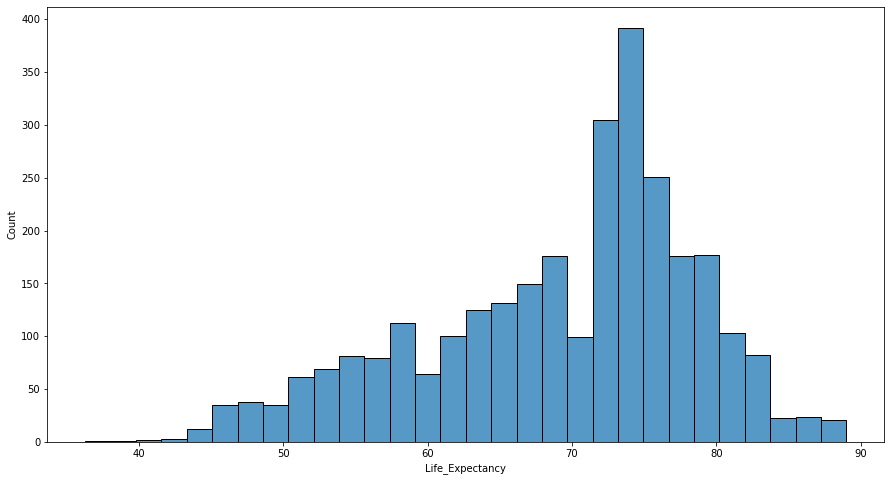

In [11]:
sns.histplot(df,x='Life_Expectancy')

<AxesSubplot:>

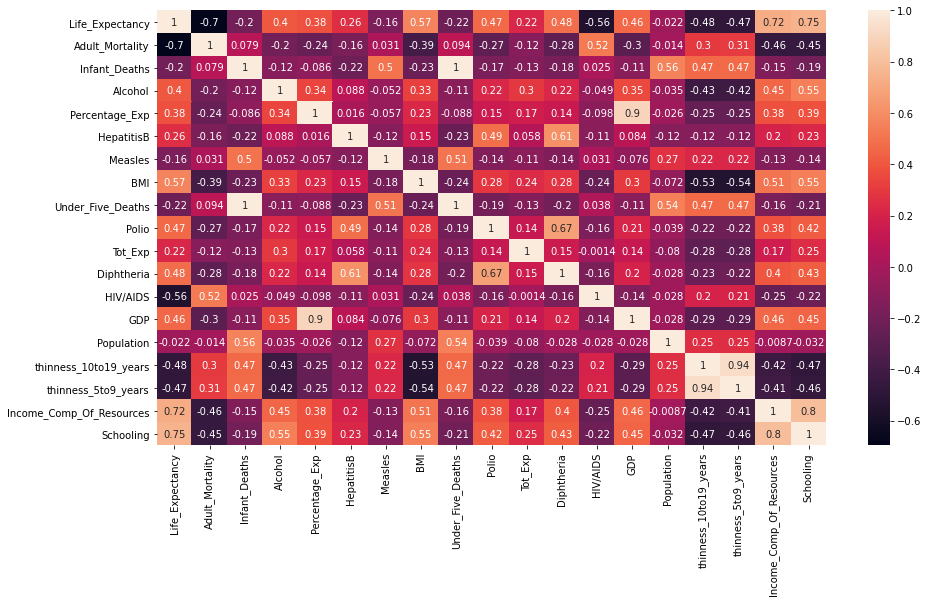

In [12]:
sns.heatmap(df.corr(),annot=True)

In [13]:
px.violin(df,y='Life_Expectancy',color='Status')

In [14]:
px.line(df.sort_values(by='Year'),x='Year',y='Life_Expectancy',animation_frame='Country',animation_group='Year')

In [15]:
px.scatter(df, x='Life_Expectancy', y='Adult_Mortality', color = 'Country')

In [16]:
px.scatter(df, x='Life_Expectancy', y='Percentage_Exp', color = 'Country')

In [17]:
px.scatter(df, x='Life_Expectancy', y='Tot_Exp', color = 'Country')

In [18]:
px.scatter(df, x='Life_Expectancy', y='Infant_Deaths', color = 'Country')

In [19]:
px.scatter(df.sort_values(by='Year'), x='Life_Expectancy', y='Schooling', color = 'Country', animation_frame='Year',
    animation_group='Country')

In [20]:
px.scatter(df, x='Adult_Mortality', y='Infant_Deaths', color = 'Country')

In [21]:
px.scatter(df.sort_values(by='Year'), x='Life_Expectancy', y='GDP', color = 'Country', animation_frame='Year',
    animation_group='Country')

In [22]:
px.scatter(df.sort_values(by='Year'), x='Life_Expectancy', y='Adult_Mortality', color = 'Country', animation_frame='Year',
    animation_group='Country')

In [23]:
px.scatter(df.sort_values(by='Year'), x='Life_Expectancy', y='Adult_Mortality', color = 'Status', animation_frame='Year',
    animation_group=None)

In [24]:
px.scatter(df.sort_values(by='Year'), x='Life_Expectancy', y='Schooling', color = 'Status', animation_frame='Year',
    animation_group=None)

#### Check Null Values

In [25]:
Total = df.isnull().sum().sort_values(ascending=False)          

Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending=False)   

missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])    
missing_data

,Total,Percentage of Missing Values
Population,652,22.191967
HepatitisB,553,18.822328
GDP,448,15.248468
Tot_Exp,226,7.692308
Alcohol,194,6.603131
Income_Comp_Of_Resources,167,5.684139
Schooling,163,5.547992
thinness_5to9_years,34,1.157250
thinness_10to19_years,34,1.157250
BMI,34,1.157250


In [26]:
df.skew()

Year                        -0.006409
Life_Expectancy             -0.638605
Adult_Mortality              1.174369
Infant_Deaths                9.786963
Alcohol                      0.589563
Percentage_Exp               4.652051
HepatitisB                  -1.930845
Measles                      9.441332
BMI                         -0.219312
Under_Five_Deaths            9.495065
Polio                       -2.098053
Tot_Exp                      0.618686
Diphtheria                  -2.072753
HIV/AIDS                     5.396112
GDP                          3.206655
Population                  15.916236
thinness_10to19_years        1.711471
thinness_5to9_years          1.777424
Income_Comp_Of_Resources    -1.143763
Schooling                   -0.602437
dtype: float64

In [27]:
df['Population'].fillna(df['Population'].median(), inplace = True)
df['HepatitisB'].fillna(df['HepatitisB'].median(), inplace = True)
df['GDP'].fillna(df['GDP'].median(), inplace = True)
df['Tot_Exp'].fillna(df['Tot_Exp'].median(), inplace = True)
df['Alcohol'].fillna(df['Alcohol'].median(), inplace = True)
df['Income_Comp_Of_Resources'].fillna(df['Income_Comp_Of_Resources'].median(), inplace = True)
df['Schooling'].fillna(df['Schooling'].median(), inplace = True)
df['thinness_5to9_years'].fillna(df['thinness_5to9_years'].median(), inplace = True)
df['thinness_10to19_years'].fillna(df['thinness_10to19_years'].median(), inplace = True)
df['BMI'].fillna(df['BMI'].median(), inplace = True)
df['Polio'].fillna(df['Polio'].median(), inplace = True)
df['Diphtheria'].fillna(df['Diphtheria'].median(), inplace = True)
df['Life_Expectancy'].fillna(df['Life_Expectancy'].median(), inplace = True)
df['Adult_Mortality'].fillna(df['Adult_Mortality'].median(), inplace = True)

In [28]:
Total = df.isnull().sum().sort_values(ascending=False)          

Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending=False)   

missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])    
missing_data

,Total,Percentage of Missing Values
Country,0,0.0
Year,0,0.0
Income_Comp_Of_Resources,0,0.0
thinness_5to9_years,0,0.0
thinness_10to19_years,0,0.0
Population,0,0.0
GDP,0,0.0
HIV/AIDS,0,0.0
Diphtheria,0,0.0
Tot_Exp,0,0.0


#### Remove insignificant variables

In [29]:
df=df.drop(['Infant_Deaths','thinness_5to9_years'],axis=1)

#### Outlier treatment

In [30]:
df.columns

Index(['Country', 'Year', 'Status', 'Life_Expectancy', 'Adult_Mortality',
       'Alcohol', 'Percentage_Exp', 'HepatitisB', 'Measles', 'BMI',
       'Under_Five_Deaths', 'Polio', 'Tot_Exp', 'Diphtheria', 'HIV/AIDS',
       'GDP', 'Population', 'thinness_10to19_years',
       'Income_Comp_Of_Resources', 'Schooling'],
      dtype='object')

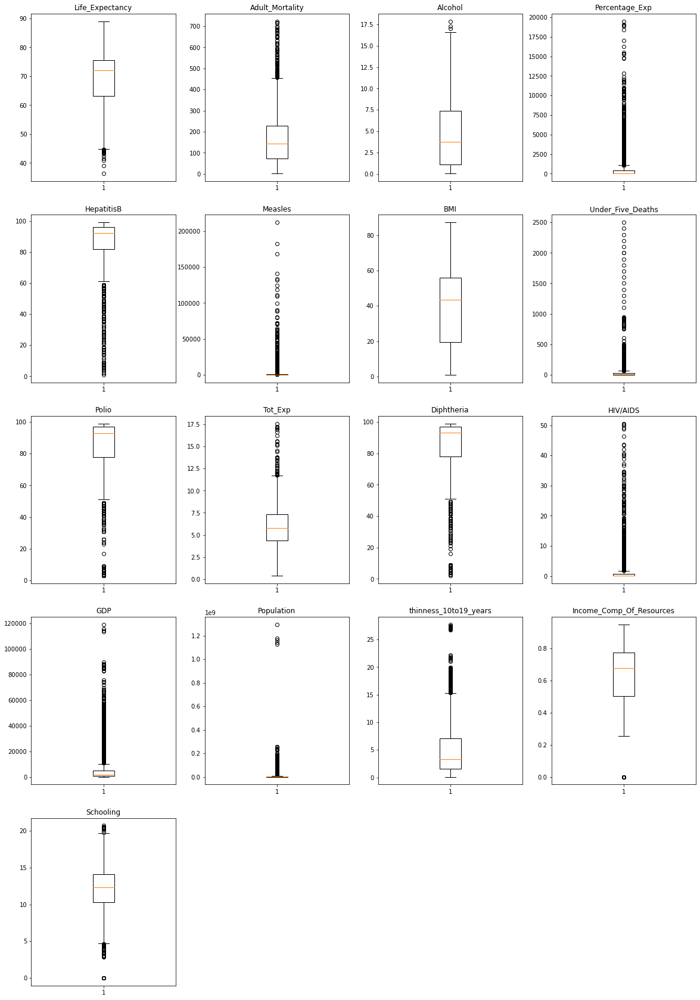

In [31]:
col_dict = {'Life_Expectancy':1,'Adult_Mortality':2,'Alcohol':3,'Percentage_Exp':4,'HepatitisB':5,'Measles':6,'BMI':7,'Under_Five_Deaths':8,'Polio':9,'Tot_Exp':10,'Diphtheria':11,'HIV/AIDS':12,'GDP':13,'Population':14,'thinness_10to19_years':15,'Income_Comp_Of_Resources':16,'Schooling':17}

# Detect outliers in each variable using box plots.
plt.figure(figsize=(20,30))

for variable,i in col_dict.items():
                     plt.subplot(5,4,i)
                     plt.boxplot(df[variable],whis=1.5)
                     plt.title(variable)

plt.show()

In [32]:
for variable in col_dict.keys():
    q75, q25 = np.percentile(df[variable], [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    print("Number of outliers and percentage of it in {} : {} and {}".format(variable,
                                                                             len((np.where((df[variable] > max_val) | 
                                                                                           (df[variable] < min_val))[0])),len((np.where((df[variable] > max_val) | 
                                                                                           (df[variable] < min_val))[0]))*100/len(df)))

Number of outliers and percentage of it in Life_Expectancy : 17 and 0.5786249149081008
Number of outliers and percentage of it in Adult_Mortality : 86 and 2.92716133424098
Number of outliers and percentage of it in Alcohol : 3 and 0.10211027910142954
Number of outliers and percentage of it in Percentage_Exp : 389 and 13.240299523485364
Number of outliers and percentage of it in HepatitisB : 322 and 10.959836623553437
Number of outliers and percentage of it in Measles : 542 and 18.44792375765827
Number of outliers and percentage of it in BMI : 0 and 0.0
Number of outliers and percentage of it in Under_Five_Deaths : 394 and 13.410483321987746
Number of outliers and percentage of it in Polio : 279 and 9.496255956432947
Number of outliers and percentage of it in Tot_Exp : 51 and 1.7358747447243021
Number of outliers and percentage of it in Diphtheria : 298 and 10.142954390742002
Number of outliers and percentage of it in HIV/AIDS : 542 and 18.44792375765827
Number of outliers and percentag

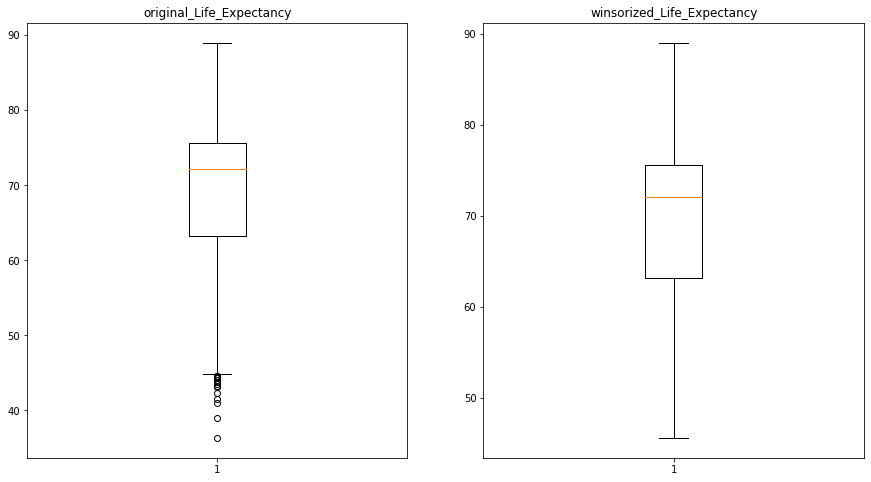

In [33]:
from scipy import stats
from scipy.stats.mstats import winsorize

plt.subplot(1,2,1)
original_Life_Expectancy = df['Life_Expectancy']
plt.boxplot(original_Life_Expectancy)
plt.title("original_Life_Expectancy")

plt.subplot(1,2,2)
winsorized_Life_Expectancy = winsorize(df['Life_Expectancy'],(0.01,0))
plt.boxplot(winsorized_Life_Expectancy)
plt.title("winsorized_Life_Expectancy")

plt.show()

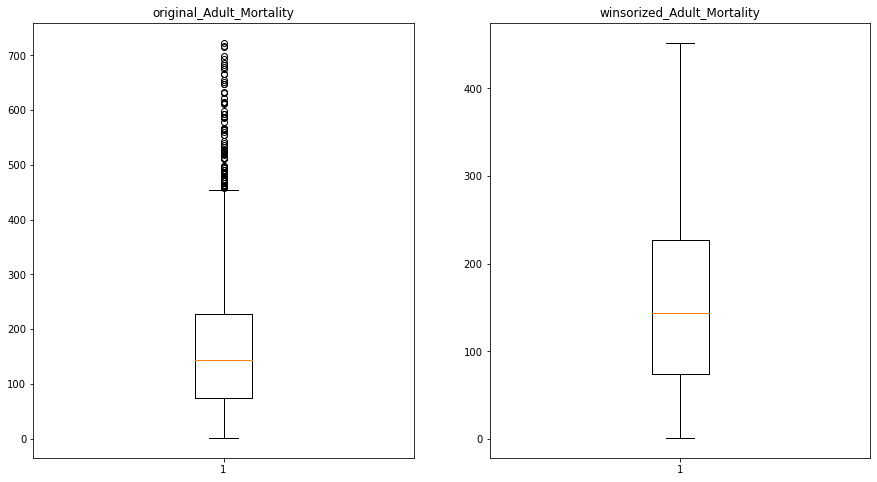

In [34]:
plt.subplot(1,2,1)
original_Adult_Mortality = df['Adult_Mortality']
plt.boxplot(original_Adult_Mortality)
plt.title("original_Adult_Mortality")

plt.subplot(1,2,2)
winsorized_Adult_Mortality = winsorize(df['Adult_Mortality'],(0,0.03))
plt.boxplot(winsorized_Adult_Mortality)
plt.title("winsorized_Adult_Mortality")

plt.show()

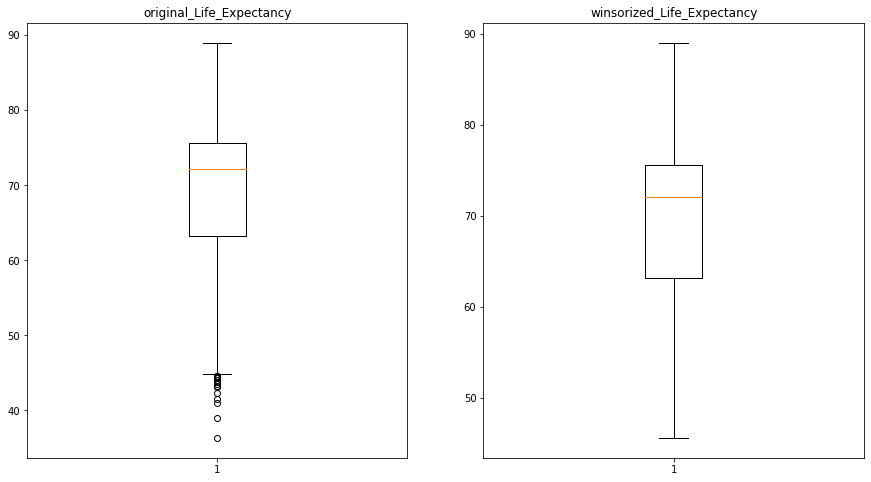

In [35]:
plt.subplot(1,2,1)
original_Alcohol = df['Alcohol']
plt.boxplot(original_Life_Expectancy)
plt.title("original_Life_Expectancy")

plt.subplot(1,2,2)
winsorized_Alcohol = winsorize(df['Alcohol'],(0,0.01))
plt.boxplot(winsorized_Life_Expectancy)
plt.title("winsorized_Life_Expectancy")

plt.show()

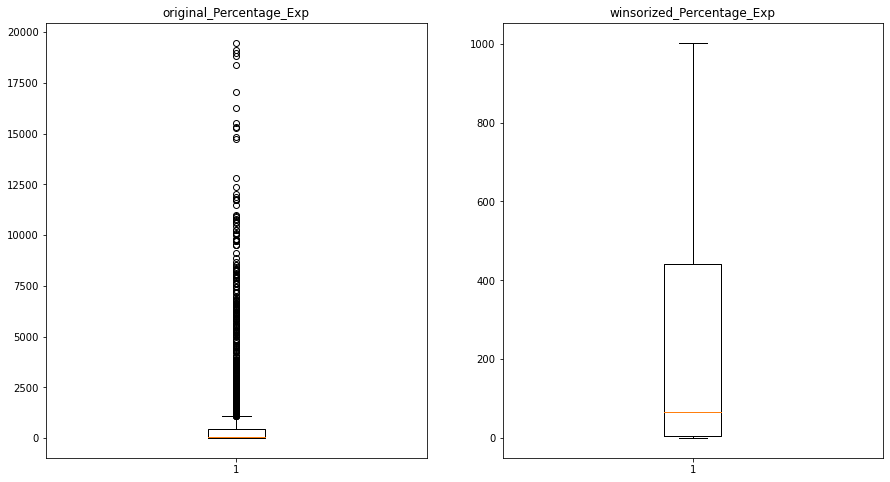

In [36]:
plt.subplot(1,2,1)
original_Percentage_Exp = df['Percentage_Exp']
plt.boxplot(original_Percentage_Exp)
plt.title("original_Percentage_Exp")

plt.subplot(1,2,2)
winsorized_Percentage_Exp = winsorize(df['Percentage_Exp'],(0,0.14))
plt.boxplot(winsorized_Percentage_Exp)
plt.title("winsorized_Percentage_Exp")

plt.show()

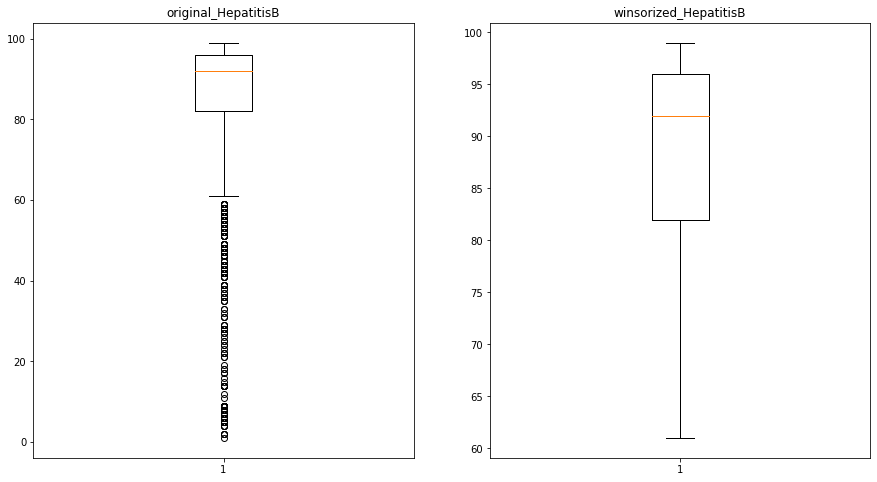

In [37]:
plt.subplot(1,2,1)
original_HepatitisB = df['HepatitisB']
plt.boxplot(original_HepatitisB)
plt.title("original_HepatitisB")

plt.subplot(1,2,2)
winsorized_HepatitisB = winsorize(df['HepatitisB'],(0.11,0))
plt.boxplot(winsorized_HepatitisB)
plt.title("winsorized_HepatitisB")

plt.show()

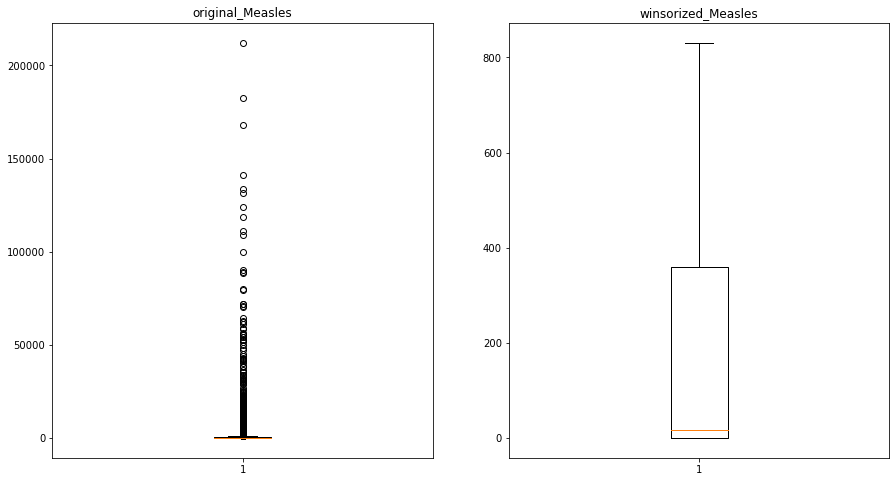

In [38]:
plt.subplot(1,2,1)
original_Measles = df['Measles']
plt.boxplot(original_Measles)
plt.title("original_Measles")

plt.subplot(1,2,2)
winsorized_Measles = winsorize(df['Measles'],(0,0.19))
plt.boxplot(winsorized_Measles)
plt.title("winsorized_Measles")

plt.show()

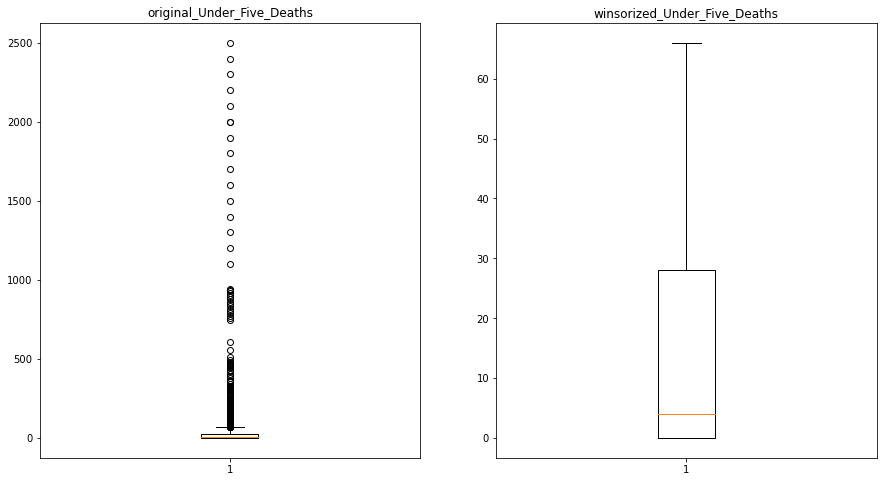

In [39]:
plt.subplot(1,2,1)
original_Under_Five_Deaths = df['Under_Five_Deaths']
plt.boxplot(original_Under_Five_Deaths)
plt.title("original_Under_Five_Deaths")

plt.subplot(1,2,2)
winsorized_Under_Five_Deaths = winsorize(df['Under_Five_Deaths'],(0,0.14))
plt.boxplot(winsorized_Under_Five_Deaths)
plt.title("winsorized_Under_Five_Deaths")

plt.show()

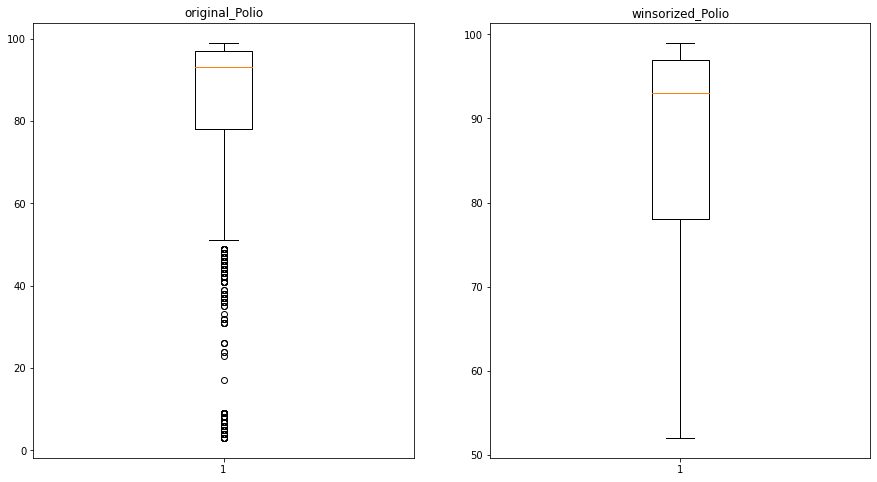

In [40]:
plt.subplot(1,2,1)
original_Polio = df['Polio']
plt.boxplot(original_Polio)
plt.title("original_Polio")

plt.subplot(1,2,2)
winsorized_Polio = winsorize(df['Polio'],(0.10,0))
plt.boxplot(winsorized_Polio)
plt.title("winsorized_Polio")

plt.show()

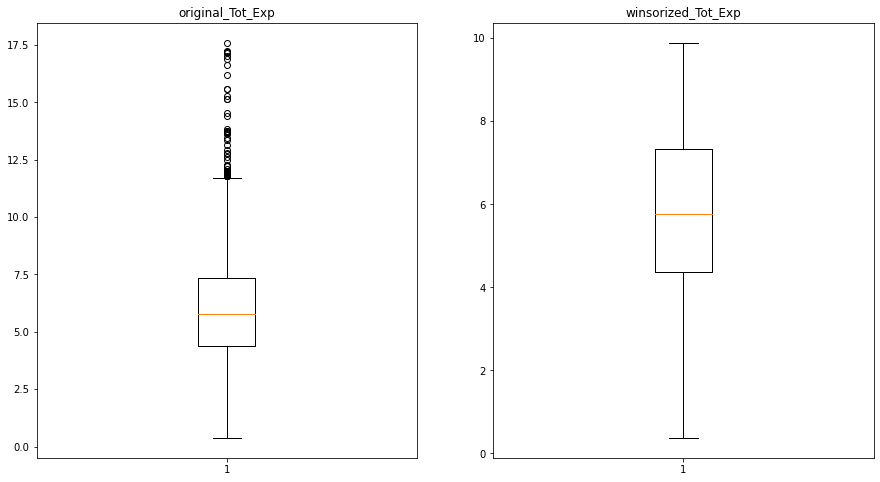

In [41]:
plt.subplot(1,2,1)
original_Tot_Exp = df['Tot_Exp']
plt.boxplot(original_Tot_Exp)
plt.title("original_Tot_Exp")

plt.subplot(1,2,2)
winsorized_Tot_Exp = winsorize(df['Tot_Exp'],(0,0.04))
plt.boxplot(winsorized_Tot_Exp)
plt.title("winsorized_Tot_Exp")

plt.show()

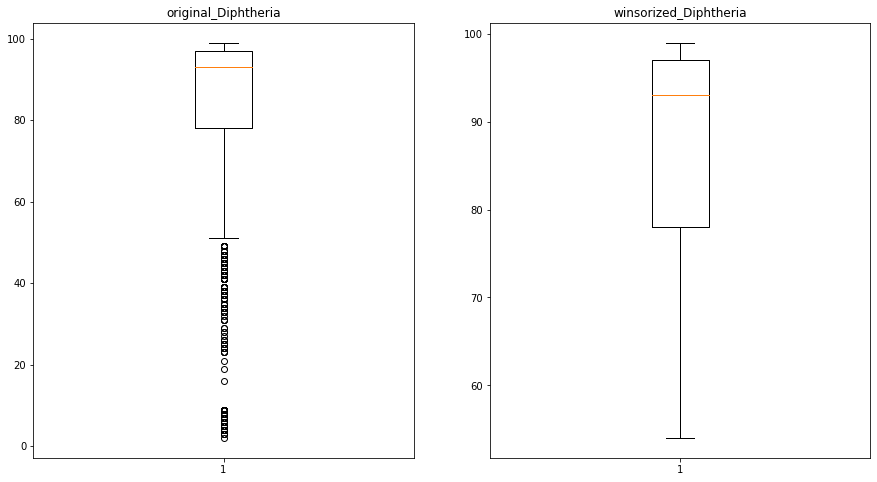

In [42]:
plt.subplot(1,2,1)
original_Diphtheria = df['Diphtheria']
plt.boxplot(original_Diphtheria)
plt.title("original_Diphtheria")

plt.subplot(1,2,2)
winsorized_Diphtheria = winsorize(df['Diphtheria'],(0.11,0))
plt.boxplot(winsorized_Diphtheria)
plt.title("winsorized_Diphtheria")

plt.show()

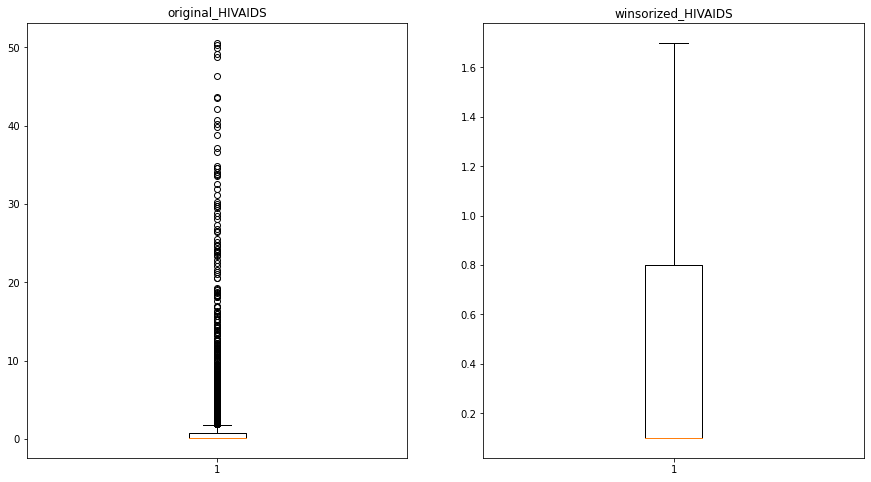

In [43]:
plt.subplot(1,2,1)
original_HIVAIDS = df['HIV/AIDS']
plt.boxplot(original_HIVAIDS)
plt.title("original_HIVAIDS")

plt.subplot(1,2,2)
winsorized_HIVAIDS = winsorize(df['HIV/AIDS'],(0,0.19))
plt.boxplot(winsorized_HIVAIDS)
plt.title("winsorized_HIVAIDS")

plt.show()

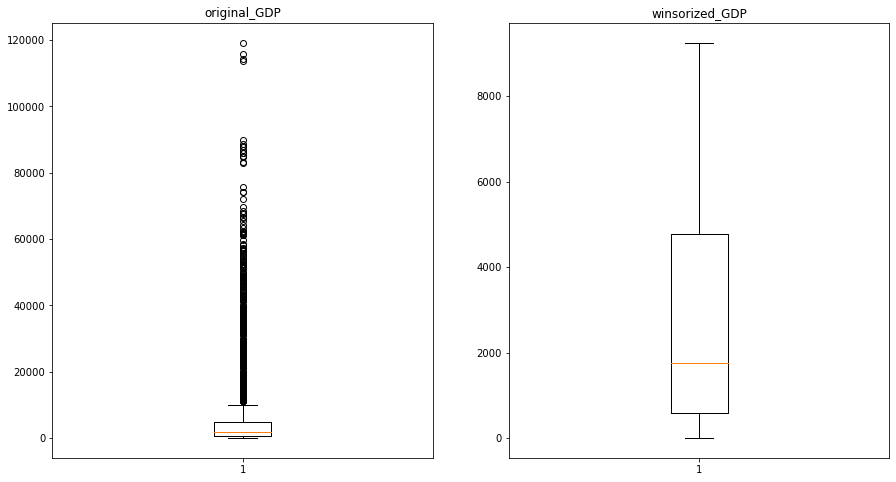

In [44]:
plt.subplot(1,2,1)
original_GDP = df['GDP']
plt.boxplot(original_GDP)
plt.title("original_GDP")

plt.subplot(1,2,2)
winsorized_GDP = winsorize(df['GDP'],(0,0.16))
plt.boxplot(winsorized_GDP)
plt.title("winsorized_GDP")

plt.show()

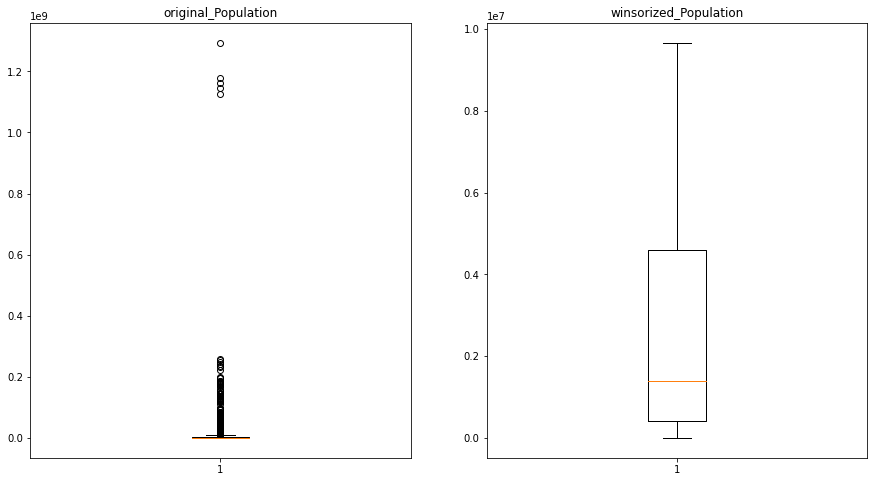

In [45]:
plt.subplot(1,2,1)
original_Population = df['Population']
plt.boxplot(original_Population)
plt.title("original_Population")

plt.subplot(1,2,2)
winsorized_Population = winsorize(df['Population'],(0,0.16))
plt.boxplot(winsorized_Population)
plt.title("winsorized_Population")

plt.show()

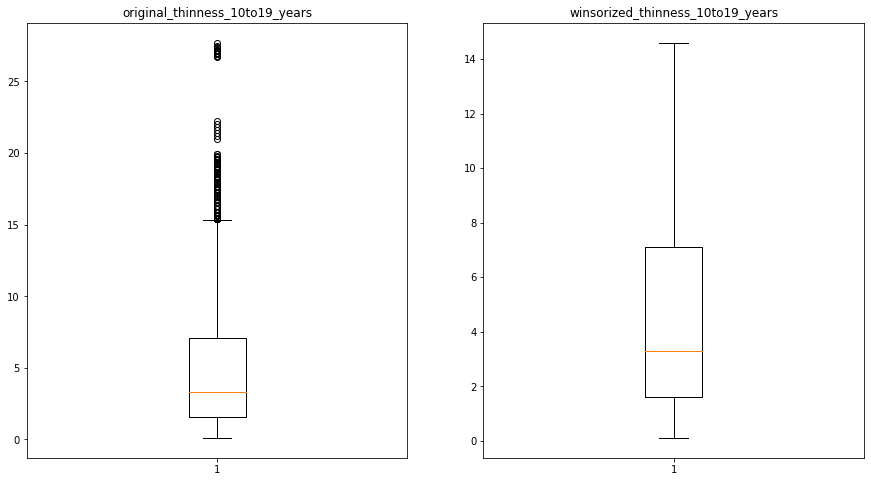

In [46]:
plt.subplot(1,2,1)
original_thinness_10to19_years = df['thinness_10to19_years']
plt.boxplot(original_thinness_10to19_years)
plt.title("original_thinness_10to19_years")

plt.subplot(1,2,2)
winsorized_thinness_10to19_years = winsorize(df['thinness_10to19_years'],(0,0.04))
plt.boxplot(winsorized_thinness_10to19_years)
plt.title("winsorized_thinness_10to19_years")

plt.show()

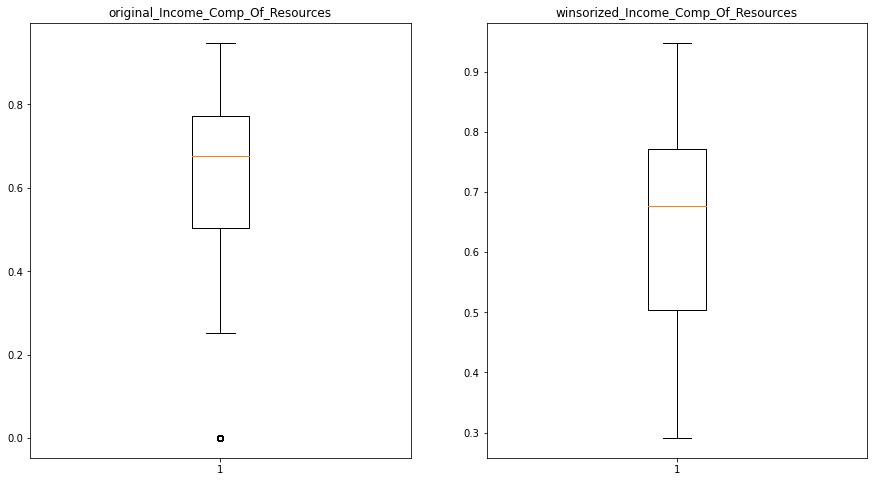

In [47]:
plt.subplot(1,2,1)
original_Income_Comp_Of_Resources = df['Income_Comp_Of_Resources']
plt.boxplot(original_Income_Comp_Of_Resources)
plt.title("original_Income_Comp_Of_Resources")

plt.subplot(1,2,2)
winsorized_Income_Comp_Of_Resources = winsorize(df['Income_Comp_Of_Resources'],(0.05,0))
plt.boxplot(winsorized_Income_Comp_Of_Resources)
plt.title("winsorized_Income_Comp_Of_Resources")

plt.show()

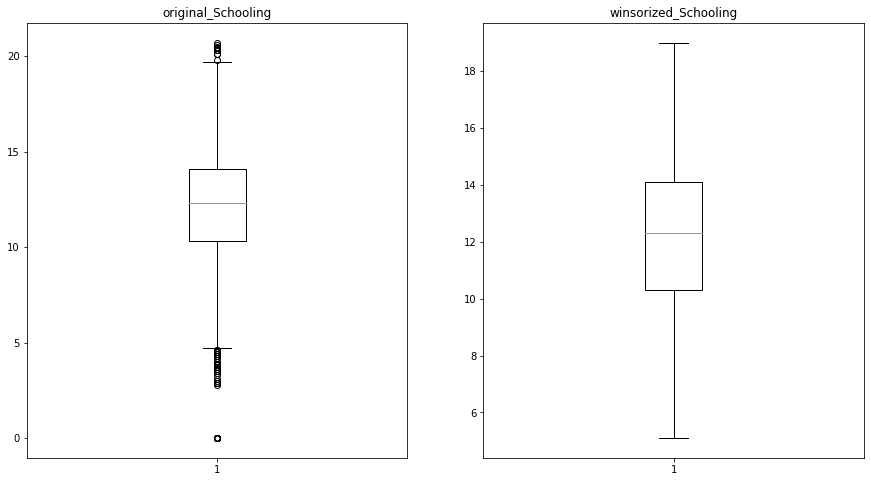

In [48]:
plt.subplot(1,2,1)
original_Schooling = df['Schooling']
plt.boxplot(original_Schooling)
plt.title("original_Schooling")

plt.subplot(1,2,2)
winsorized_Schooling = winsorize(df['Schooling'],(0.03,0.01))
plt.boxplot(winsorized_Schooling)
plt.title("winsorized_Schooling")

plt.show()

In [49]:
win_list = [winsorized_Life_Expectancy,winsorized_Adult_Mortality,winsorized_Alcohol,
            winsorized_Percentage_Exp,winsorized_HepatitisB,winsorized_Under_Five_Deaths,winsorized_Polio,
            winsorized_Tot_Exp,winsorized_Diphtheria,winsorized_HIVAIDS,winsorized_GDP,winsorized_Population,
            winsorized_thinness_10to19_years,winsorized_Income_Comp_Of_Resources,winsorized_Schooling]

for variable in win_list:
    q75, q25 = np.percentile(variable, [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    
    print("Number of outliers after winsorization : {}".format(len(np.where((variable > max_val) | (variable < min_val))[0])))

Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0
Number of outliers after winsorization : 0


In [50]:
col_dict.keys()

dict_keys(['Life_Expectancy', 'Adult_Mortality', 'Alcohol', 'Percentage_Exp', 'HepatitisB', 'Measles', 'BMI', 'Under_Five_Deaths', 'Polio', 'Tot_Exp', 'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness_10to19_years', 'Income_Comp_Of_Resources', 'Schooling'])

In [51]:
df['Life_Expectancy']=winsorized_Life_Expectancy
df['Adult_Mortality']=winsorized_Adult_Mortality
df['Alcohol']=winsorized_Alcohol
df['Percentage_Exp']=winsorized_Percentage_Exp
df['HepatitisB']=winsorized_HepatitisB
df['Measles']=winsorized_Measles
df['Under_Five_Deaths']=winsorized_Under_Five_Deaths
df['Polio']=winsorized_Polio
df['Tot_Exp']=winsorized_Tot_Exp
df['Diphtheria']=winsorized_Diphtheria
df['HIV/AIDS']=winsorized_HIVAIDS
df['GDP']=winsorized_GDP
df['Population']=winsorized_Population
df['thinness_10to19_years']=winsorized_thinness_10to19_years
df['Income_Comp_Of_Resources']=winsorized_Income_Comp_Of_Resources
df['Schooling']=winsorized_Schooling

In [52]:
df.describe()

,Life_Expectancy,Adult_Mortality,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,Income_Comp_Of_Resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000
mean,69.251736,161.820626,4.533468,271.234472,87.008850,220.691287,38.381178,17.417971,85.595643,5.831732,85.771273,0.508237,3163.756446,2.992249e+06,4.659292,0.643335,12.068380
std,9.462888,115.151852,3.887282,363.172291,12.308952,329.192321,19.935375,24.075262,15.275315,2.160928,14.752922,0.640847,3231.513754,3.483256e+06,3.858568,0.171333,3.060397
min,45.600000,1.000000,0.010000,0.000000,61.000000,0.000000,1.000000,0.000000,52.000000,0.370000,54.000000,0.100000,1.681350,3.400000e+01,0.100000,0.291000,5.100000
25%,63.200000,74.000000,1.092500,4.685343,82.000000,0.000000,19.400000,0.000000,78.000000,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,0.504250,10.300000
50%,72.100000,144.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.755000,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,0.677000,12.300000
75%,75.600000,227.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,4779.405190,4.584371e+06,7.100000,0.772000,14.100000
max,89.000000,452.000000,13.450000,1002.833273,99.000000,831.000000,87.300000,66.000000,99.000000,9.890000,99.000000,1.700000,9252.117240,9.663915e+06,14.600000,0.948000,19.000000


In [53]:
round(df[['Status','Life_Expectancy']].groupby(['Status']).mean(),2)

,Life_Expectancy
Status,
Developed,79.20
Developing,67.15


From the above, developed countries have higher average Life_Expectancy compared to Developing.

Let us find out statistically if this difference is significant.

In [54]:
# Finding the significance of difference of Average_Life_Expectancy between Developed and Developing countries using 
# t-test
stats.ttest_ind(df.loc[df['Status']=='Developed','Life_Expectancy'],df.loc[df['Status']=='Developing','Life_Expectancy'])

Ttest_indResult(statistic=29.88402809097244, pvalue=1.4826287189857218e-171)

pval < 0.05. Hence the difference is significant

In [55]:
df_target = df['Life_Expectancy']
df_feature = df.drop('Life_Expectancy',axis=1)

##### Filter numerical and categorical variables

In [56]:
df_num = df_feature.select_dtypes(include = [np.number])
df_num.columns

Index(['Adult_Mortality', 'Alcohol', 'Percentage_Exp', 'HepatitisB', 'Measles',
       'BMI', 'Under_Five_Deaths', 'Polio', 'Tot_Exp', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness_10to19_years',
       'Income_Comp_Of_Resources', 'Schooling'],
      dtype='object')

In [57]:
df_cat = df_feature.select_dtypes(include = [np.object])
df_cat.columns

Index(['Country', 'Year', 'Status'], dtype='object')

#### Encoding

In [58]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for col in df_cat.columns:
    df_cat[col]=le.fit_transform(df_cat[col])

#### Scaling

In [59]:
from sklearn.preprocessing import StandardScaler

X_scaler = StandardScaler()

num_scaled = X_scaler.fit_transform(df_num)

df_num_scaled = pd.DataFrame(num_scaled, columns = df_num.columns) 

In [60]:
X = pd.concat([df_num_scaled, df_cat], axis = 1)

X.head()

,Adult_Mortality,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,Income_Comp_Of_Resources,Schooling,Country,Year,Status
0,0.878810,-1.163857,-0.550672,-1.788340,1.854274,-0.967349,2.018267,-2.199716,1.077622,-1.408183,-0.637136,-0.798368,1.915679,2.576708,-0.959316,-0.643287,0,15,1
1,0.948295,-1.163857,-0.544492,-2.032107,0.824305,-0.992434,2.018267,-1.806859,1.086879,-1.611567,-0.637136,-0.789566,-0.765123,2.576708,-0.976829,-0.675968,0,14,1
2,0.922238,-1.163857,-0.545331,-1.869596,0.635933,-1.017519,2.018267,-1.544954,1.063737,-1.475977,-0.637136,-0.783671,1.915679,2.576708,-1.011854,-0.708650,0,13,1
3,0.956981,-1.163857,-0.531657,-1.625829,1.854274,-1.042605,2.018267,-1.217573,1.244246,-1.272593,-0.637136,-0.771843,0.202348,2.576708,-1.052717,-0.741331,0,12,1
4,0.983038,-1.163857,-0.727430,-1.544574,1.854274,-1.062673,2.018267,-1.152097,0.943398,-1.204798,-0.637136,-0.959534,-0.003919,2.576708,-1.105255,-0.839374,0,11,1


In [61]:
y = df_target

In [62]:
def get_train_rmse(model):
    
    train_pred = model.predict(X_train)
    mse_train = mean_squared_error(y_train, train_pred)
    rmse_train = round(np.sqrt(mse_train), 4)
    
    return(rmse_train)

In [63]:
def get_test_rmse(model):
    
    test_pred = model.predict(X_test)
    mse_test = mean_squared_error(y_test, test_pred)
    rmse_test = round(np.sqrt(mse_test), 4)

    return(rmse_test)

In [64]:
def mape(actual, predicted):
    return (np.mean(np.abs((actual - predicted) / actual)) * 100)

def get_test_mape(model):

    test_pred = model.predict(X_test)
    mape_test = mape(y_test, test_pred)

    return(mape_test)

In [65]:
def get_score(model):
    
    r_sq = model.score(X_train, y_train)
    n = X_train.shape[0]
    k = X_train.shape[1]
    r_sq_adj = 1 - ((1-r_sq)*(n-1)/(n-k-1))
    
    return ([r_sq, r_sq_adj])

In [66]:
score_card = pd.DataFrame(columns=['Model_Name', 'Alpha (Wherever Required)', 'R-Squared',
                                       'Adj. R-Squared', 'Test_RMSE', 'Test_MAPE'])

def update_score_card(algorithm_name, model, alpha = '-'):

    global score_card

    score_card = score_card.append({'Model_Name': algorithm_name,
                       'Alpha (Wherever Required)': alpha, 
                       'Test_MAPE': get_test_mape(model), 
                       'Test_RMSE': get_test_rmse(model), 
                       'R-Squared': get_score(model)[0], 
                       'Adj. R-Squared': get_score(model)[1]}, ignore_index = True)

In [67]:
def plot_coefficients(model, algorithm_name):
    
    df_coeff = pd.DataFrame({'Variable': X.columns, 'Coefficient': model.coef_})

    sorted_coeff = df_coeff.sort_values('Coefficient', ascending = False)

    sns.barplot(x = "Coefficient", y = "Variable", data = sorted_coeff)

    plt.xlabel("Coefficients from {}".format(algorithm_name), fontsize = 15)

    plt.ylabel('Features', fontsize = 15)

In [68]:
from sklearn.model_selection import train_test_split

X = sm.add_constant(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10, test_size = 0.3)

print('X_train', X_train.shape)
print('y_train', y_train.shape)

print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (2056, 20)
y_train (2056,)
X_test (882, 20)
y_test (882,)


In [69]:
MLR_model = sm.OLS(y_train, X_train).fit()

print(MLR_model.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.855
Model:                            OLS   Adj. R-squared:                  0.854
Method:                 Least Squares   F-statistic:                     631.4
Date:                Sat, 17 Sep 2022   Prob (F-statistic):               0.00
Time:                        18:24:24   Log-Likelihood:                -5581.4
No. Observations:                2056   AIC:                         1.120e+04
Df Residuals:                    2036   BIC:                         1.132e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

#### Check MutliCollinearity

In [70]:
df_numeric_features_vif = df_feature.select_dtypes(include=[np.number])

df_numeric_features_vif.head()

,Adult_Mortality,Alcohol,Percentage_Exp,HepatitisB,Measles,BMI,Under_Five_Deaths,Polio,Tot_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_10to19_years,Income_Comp_Of_Resources,Schooling
0,263.0,0.01,71.279624,65.0,831,19.1,66,52.0,8.16,65.0,0.1,584.259210,9663915.0,14.6,0.479,10.1
1,271.0,0.01,73.523582,62.0,492,18.6,66,58.0,8.18,62.0,0.1,612.696514,327582.0,14.6,0.476,10.0
2,268.0,0.01,73.219243,64.0,430,18.1,66,62.0,8.13,64.0,0.1,631.744976,9663915.0,14.6,0.470,9.9
3,272.0,0.01,78.184215,67.0,831,17.6,66,67.0,8.52,67.0,0.1,669.959000,3696958.0,14.6,0.463,9.8
4,275.0,0.01,7.097109,68.0,831,17.2,66,68.0,7.87,68.0,0.1,63.537231,2978599.0,14.6,0.454,9.5


In [71]:
vif = pd.DataFrame()

vif["VIF_Factor"] = [variance_inflation_factor(df_numeric_features_vif.values, i) for i in range(df_numeric_features_vif.shape[1])]

vif["Features"] = df_numeric_features_vif.columns

vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

,VIF_Factor,Features
0,147.670894,Diphtheria
1,129.398808,Polio
2,79.672392,Schooling
3,76.655080,Income_Comp_Of_Resources
4,63.200226,HepatitisB
5,9.722328,Tot_Exp
6,8.242849,BMI
7,8.055993,GDP
8,5.786271,Percentage_Exp
9,4.891916,Adult_Mortality


In [72]:
for ind in range(len(df_numeric_features_vif.columns)):
    
    # create an empty dataframe
    vif = pd.DataFrame()

    # calculate VIF using list comprehension
    # use for loop to access each variable 
    # calculate VIF for each variable and create a column 'VIF_Factor' to store the values 
    vif["VIF_Factor"] = [variance_inflation_factor(df_numeric_features_vif.values, i) for i in range(df_numeric_features_vif.shape[1])]

    # create a column of variable names
    vif["Features"] = df_numeric_features_vif.columns

    # filter the variables with VIF greater than 10 and store it in a dataframe 'multi' 
    # one can choose the threshold other than 10 (it depends on the business requirements)
    multi = vif[vif['VIF_Factor'] > 20]
    
    # if dataframe 'multi' is not empty, then sort the dataframe by VIF values
    # if dataframe 'multi' is empty (i.e. all VIF <= 10), then print the dataframe 'vif' and break the for loop using 'break' 
    # 'by' sorts the data using given variable(s)
    # 'ascending = False' sorts the data in descending order
    if(multi.empty == False):
        df_sorted = multi.sort_values(by = 'VIF_Factor', ascending = False)
    else:
        print(vif)
        break
    
    # use if-else to drop the variable with the highest VIF
    # if  dataframe 'df_sorted' is not empty, then drop the first entry in the column 'Features' from the numeric variables
    # select the variable using 'iloc[]'
    # 'axis=1' drops the corresponding column
    #  else print the final dataframe 'vif' with all values after removal of variables with VIF less than 10  
    if (df_sorted.empty == False):
        df_numeric_features_vif = df_numeric_features_vif.drop(df_sorted.Features.iloc[0], axis=1)
    else:
        print(vif)

    VIF_Factor                  Features
0     4.693217           Adult_Mortality
1     3.670341                   Alcohol
2     5.743724            Percentage_Exp
3     2.271157                   Measles
4     7.923649                       BMI
5     3.445427         Under_Five_Deaths
6     8.446677                   Tot_Exp
7     3.097447                  HIV/AIDS
8     8.024161                       GDP
9     2.058799                Population
10    3.607945     thinness_10to19_years
11   18.870650  Income_Comp_Of_Resources


In [73]:
df_numeric_features_vif.head()

,Adult_Mortality,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Tot_Exp,HIV/AIDS,GDP,Population,thinness_10to19_years,Income_Comp_Of_Resources
0,263.0,0.01,71.279624,831,19.1,66,8.16,0.1,584.259210,9663915.0,14.6,0.479
1,271.0,0.01,73.523582,492,18.6,66,8.18,0.1,612.696514,327582.0,14.6,0.476
2,268.0,0.01,73.219243,430,18.1,66,8.13,0.1,631.744976,9663915.0,14.6,0.470
3,272.0,0.01,78.184215,831,17.6,66,8.52,0.1,669.959000,3696958.0,14.6,0.463
4,275.0,0.01,7.097109,831,17.2,66,7.87,0.1,63.537231,2978599.0,14.6,0.454


In [74]:
# concat the dummy variables with numeric features to create a dataframe of all independent variables
# 'axis=1' concats the dataframes along columns 
df_dummy = pd.concat([df_numeric_features_vif, df_cat], axis=1)

# display first five observations
df_dummy.head()

,Adult_Mortality,Alcohol,Percentage_Exp,Measles,BMI,Under_Five_Deaths,Tot_Exp,HIV/AIDS,GDP,Population,thinness_10to19_years,Income_Comp_Of_Resources,Country,Year,Status
0,263.0,0.01,71.279624,831,19.1,66,8.16,0.1,584.259210,9663915.0,14.6,0.479,0,15,1
1,271.0,0.01,73.523582,492,18.6,66,8.18,0.1,612.696514,327582.0,14.6,0.476,0,14,1
2,268.0,0.01,73.219243,430,18.1,66,8.13,0.1,631.744976,9663915.0,14.6,0.470,0,13,1
3,272.0,0.01,78.184215,831,17.6,66,8.52,0.1,669.959000,3696958.0,14.6,0.463,0,12,1
4,275.0,0.01,7.097109,831,17.2,66,7.87,0.1,63.537231,2978599.0,14.6,0.454,0,11,1


In [75]:
from sklearn.model_selection import train_test_split

df_dummy = sm.add_constant(df_dummy)

X_train_dummy, X_test_dummy, y_train, y_test = train_test_split(df_dummy, y, random_state = 10, test_size = 0.3)

print('X_train', X_train_dummy.shape)
print('y_train', y_train.shape)

print('X_test', X_test_dummy.shape)
print('y_test', y_test.shape)

X_train (2056, 16)
y_train (2056,)
X_test (882, 16)
y_test (882,)


In [76]:
MLR_model_dummy = sm.OLS(y_train, X_train_dummy).fit()

print(MLR_model_dummy.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.849
Model:                            OLS   Adj. R-squared:                  0.848
Method:                 Least Squares   F-statistic:                     767.6
Date:                Sat, 17 Sep 2022   Prob (F-statistic):               0.00
Time:                        18:24:24   Log-Likelihood:                -5619.1
No. Observations:                2056   AIC:                         1.127e+04
Df Residuals:                    2040   BIC:                         1.136e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

##### Calculate the p-values to know the insignificant variables

In [77]:
MLR_pvalues = pd.DataFrame(MLR_model.pvalues, columns = ["P-Value"])

MLR_pvalues

,P-Value
const,0.000000e+00
Adult_Mortality,9.399958e-56
Alcohol,3.596209e-01
Percentage_Exp,1.246141e-03
HepatitisB,1.577913e-06
Measles,9.424359e-01
BMI,3.833787e-01
Under_Five_Deaths,1.079077e-25
Polio,1.247802e-01
Tot_Exp,1.483502e-02


In [78]:
insignificant_var = MLR_pvalues[1:][MLR_pvalues[1:]['P-Value'] > 0.05]

insigni_var = insignificant_var.index

insigni_var = insigni_var.to_list()

insigni_var

['Alcohol', 'Measles', 'BMI', 'Polio', 'GDP', 'Schooling', 'Country']

The above variables seems important to the model although the pvalue > 0.05. Hence, these variables will not be dropped.

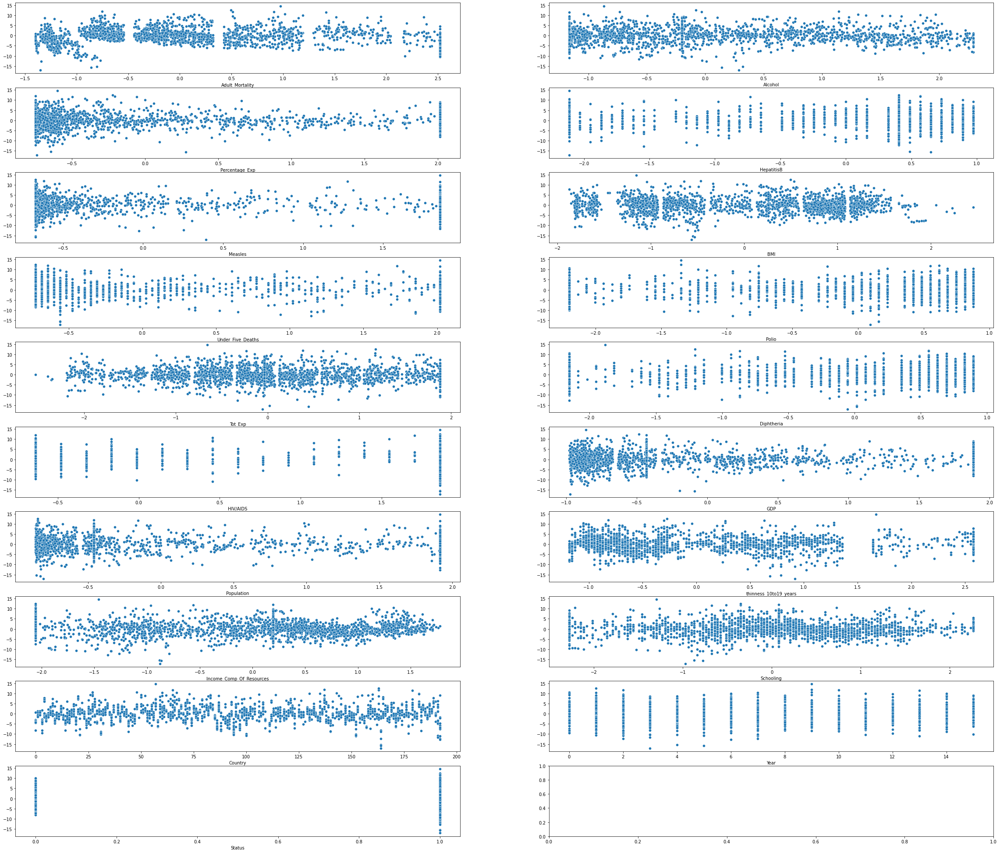

In [79]:
fig, ax = plt.subplots(nrows = 10, ncols= 2, figsize=(40, 35))

for variable, subplot in zip(X_train.columns[1:], ax.flatten()):
    sns.scatterplot(X_train[variable], MLR_model.resid , ax=subplot)

# display the plot
plt.show()

In [80]:
stat, p_value = shapiro(MLR_model.resid)

# print the test statistic and corresponding p-value 
print('Test statistic:', stat)
print('P-Value:', p_value)

Test statistic: 0.9864397644996643
P-Value: 4.771110264679967e-13


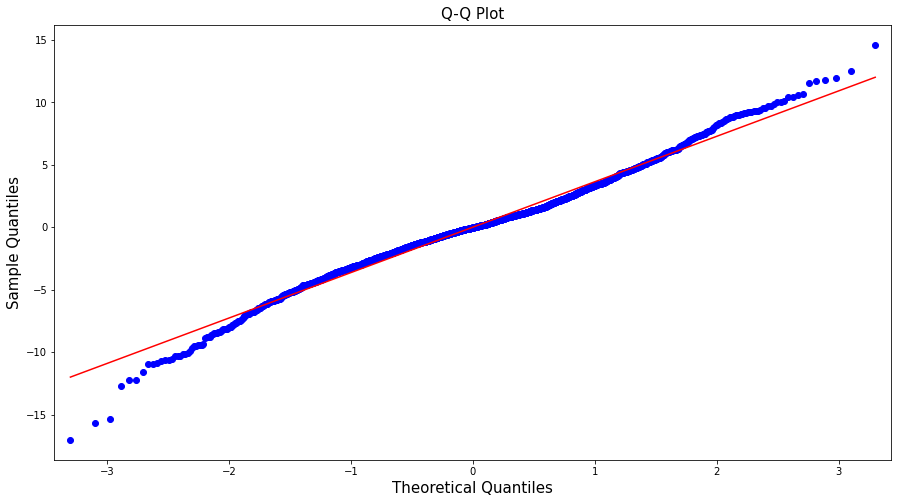

In [81]:
# set the plot size using 'rcParams'
# once the plot size is set using 'rcParams', it sets the size of all the forthcoming plots in the file
# pass width and height in inches to 'figure.figsize' 
plt.rcParams['figure.figsize'] = [15,8]

# plot the Q-Q plot
# 'r' represents the regression line
qqplot(MLR_model.resid, line = 'r')

# set plot and axes labels
# set text size using 'fontsize'
plt.title('Q-Q Plot', fontsize = 15)
plt.xlabel('Theoretical Quantiles', fontsize = 15)
plt.ylabel('Sample Quantiles', fontsize = 15)

# display the plot
plt.show()

In [82]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [83]:
X = pd.concat([df_num_scaled, df_cat], axis = 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10, test_size = 0.3)

print('X_train', X_train.shape)
print('y_train', y_train.shape)

print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (2056, 19)
y_train (2056,)
X_test (882, 19)
y_test (882,)


In [84]:
y.head()

0    65.0
1    59.9
2    59.9
3    59.5
4    59.2
Name: Life_Expectancy, dtype: float64

In [85]:
linreg_rfe = LinearRegression()

rfe_model = RFE(estimator=linreg_rfe, n_features_to_select = 12)

rfe_model = rfe_model.fit(X_train, y_train)

feat_index = pd.Series(data = rfe_model.ranking_, index = X_train.columns)

feat_index

Adult_Mortality             1
Alcohol                     3
Percentage_Exp              1
HepatitisB                  1
Measles                     6
BMI                         2
Under_Five_Deaths           1
Polio                       1
Tot_Exp                     1
Diphtheria                  1
HIV/AIDS                    1
GDP                         7
Population                  1
thinness_10to19_years       1
Income_Comp_Of_Resources    1
Schooling                   5
Country                     8
Year                        4
Status                      1
dtype: int32

In [86]:
# Insignificant variables. However these variables cannot be removed as they seem important.

feat_index[feat_index>1].index

Index(['Alcohol', 'Measles', 'BMI', 'GDP', 'Schooling', 'Country', 'Year'], dtype='object')

In [87]:
# Significant variables

feat_index[feat_index==1].index

Index(['Adult_Mortality', 'Percentage_Exp', 'HepatitisB', 'Under_Five_Deaths',
       'Polio', 'Tot_Exp', 'Diphtheria', 'HIV/AIDS', 'Population',
       'thinness_10to19_years', 'Income_Comp_Of_Resources', 'Status'],
      dtype='object')

### Linear Regression

In [88]:
linreg = LinearRegression()

linreg_model = linreg.fit(X_train, y_train)

linreg_model.score(X_train, y_train)

0.8549073985536579

In [89]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(linreg_model))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(linreg_model))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(linreg_model) - get_train_rmse(linreg_model))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  3.6537
RMSE on test set:  3.4493
Difference between RMSE on train and test set:  0.20440000000000014


In [90]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Linear Regression', model = linreg_model)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161


##### Cross validation

In [91]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(estimator = LinearRegression(), 
                         X = X_train, 
                         y = y_train, 
                         cv = 5, 
                         scoring = 'r2')

In [92]:
print("\nMinimum score obtained: ", round(min(scores), 4))
print("Maximum score obtained: ", round(max(scores), 4))
print("Average score obtained: ", round(np.mean(scores), 4))


Minimum score obtained:  0.8438
Maximum score obtained:  0.8677
Average score obtained:  0.851


### Decision Tree

In [93]:
from sklearn.tree import DecisionTreeRegressor

dectree = DecisionTreeRegressor()

dectree_model = dectree.fit(X_train, y_train)

dectree_model.score(X_train, y_train)

1.0

In [94]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(dectree_model))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(dectree_model))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(dectree_model) - get_train_rmse(dectree_model))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  0.0
RMSE on test set:  2.7719
Difference between RMSE on train and test set:  2.7719


In [95]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Decision Tree', model = dectree_model)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148


##### Cross Validation

In [96]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(estimator = dectree, 
                         X = X_train, 
                         y = y_train, 
                         cv = 5, 
                         scoring = 'r2')

In [97]:
print("\nMinimum score obtained: ", round(min(scores), 4))
print("Maximum score obtained: ", round(max(scores), 4))
print("Average score obtained: ", round(np.mean(scores), 4))


Minimum score obtained:  0.8838
Maximum score obtained:  0.916
Average score obtained:  0.905


### Random Forest

In [98]:
from sklearn.ensemble import RandomForestRegressor

rfreg = RandomForestRegressor()

rfreg_model = rfreg.fit(X_train, y_train)

rfreg_model.score(X_train, y_train)

0.9948274659325721

In [99]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(rfreg_model))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(rfreg_model))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(rfreg_model) - get_train_rmse(rfreg_model))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  0.6899
RMSE on test set:  1.8373
Difference between RMSE on train and test set:  1.1474


In [100]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Random Forest', model = rfreg_model)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336


##### Cross Validation

In [101]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(estimator = rfreg, 
                         X = X_train, 
                         y = y_train, 
                         cv = 5, 
                         scoring = 'r2')

In [102]:
print("\nMinimum score obtained: ", round(min(scores), 4))
print("Maximum score obtained: ", round(max(scores), 4))
print("Average score obtained: ", round(np.mean(scores), 4))


Minimum score obtained:  0.9547
Maximum score obtained:  0.9618
Average score obtained:  0.9577


### KNN

In [103]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=5)

knn_model = knn.fit(X_train, y_train)

knn_model.score(X_train, y_train)

0.9415562043027351

In [104]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(knn_model))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(knn_model))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(knn_model) - get_train_rmse(knn_model))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  2.3189
RMSE on test set:  3.1391
Difference between RMSE on train and test set:  0.8201999999999998


In [105]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'KNN', model = knn_model)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336
3,KNN,-,0.941556,0.941011,3.1391,3.304763


##### Cross Validation

In [106]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(estimator = knn, 
                         X = X_train, 
                         y = y_train, 
                         cv = 5, 
                         scoring = 'r2')

In [107]:
print("\nMinimum score obtained: ", round(min(scores), 4))
print("Maximum score obtained: ", round(max(scores), 4))
print("Average score obtained: ", round(np.mean(scores), 4))


Minimum score obtained:  0.8621
Maximum score obtained:  0.8932
Average score obtained:  0.8721


In [108]:
from sklearn.linear_model import SGDRegressor

# import function for ridge regression
from sklearn.linear_model import Ridge

# import function for lasso regression
from sklearn.linear_model import Lasso

# import function for elastic net regression
from sklearn.linear_model import ElasticNet

### Ridge Regression

In [109]:
#alpha =1 is considered

from sklearn.linear_model import Ridge

ridge = Ridge(alpha = 1, max_iter = 500)
ridge_model_1 = ridge.fit(X_train, y_train)

ridge_model_1.score(X_train, y_train)

0.8549072381540002

In [110]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(ridge_model_1))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(ridge_model_1))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(ridge_model_1) - get_train_rmse(ridge_model_1))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  3.6537
RMSE on test set:  3.4492
Difference between RMSE on train and test set:  0.20450000000000035


In [111]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Ridge Regression (with alpha = 1)',alpha = 1, model = ridge_model_1)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336
3,KNN,-,0.941556,0.941011,3.1391,3.304763
4,Ridge Regression (with alpha = 1),1,0.854907,0.853553,3.4492,3.827326


In [112]:
#alpha = 2 is considered

from sklearn.linear_model import Ridge

ridge = Ridge(alpha = 2, max_iter = 500)
ridge_model_2 = ridge.fit(X_train, y_train)

ridge_model_2.score(X_train, y_train)

0.8549067616189846

In [113]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(ridge_model_2))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(ridge_model_2))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(ridge_model_2) - get_train_rmse(ridge_model_2))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  3.6537
RMSE on test set:  3.449
Difference between RMSE on train and test set:  0.20470000000000033


In [114]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Ridge Regression (with alpha = 2)', alpha = 2, model = ridge_model_2)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336
3,KNN,-,0.941556,0.941011,3.1391,3.304763
4,Ridge Regression (with alpha = 1),1,0.854907,0.853553,3.4492,3.827326
5,Ridge Regression (with alpha = 2),2,0.854907,0.853553,3.4490,3.827486


### Lasso Regression

In [115]:
# Here, we consider alpha = 0.01
from sklearn.linear_model import Lasso

lasso = Lasso(alpha = 0.01, max_iter = 500)
lasso_model_1 = lasso.fit(X_train, y_train)

lasso_model_1.score(X_train, y_train)

0.8548914468047808

In [116]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(lasso_model_1))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(lasso_model_1))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(lasso_model_1) - get_train_rmse(lasso_model_1))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  3.6539
RMSE on test set:  3.4523
Difference between RMSE on train and test set:  0.2016


In [117]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Lasso Regression (with alpha = 0.01)', alpha = 0.01, model = lasso_model_1)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336
3,KNN,-,0.941556,0.941011,3.1391,3.304763
4,Ridge Regression (with alpha = 1),1,0.854907,0.853553,3.4492,3.827326
5,Ridge Regression (with alpha = 2),2,0.854907,0.853553,3.4490,3.827486
6,Lasso Regression (with alpha = 0.01),0.01,0.854891,0.853537,3.4523,3.831921


In [118]:
# Here, we consider alpha = 0.02
from sklearn.linear_model import Lasso

lasso = Lasso(alpha = 0.02, max_iter = 500)
lasso_model_2 = lasso.fit(X_train, y_train)

lasso_model_2.score(X_train, y_train)

0.854845923112871

In [119]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(lasso_model_2))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(lasso_model_2))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(lasso_model_2) - get_train_rmse(lasso_model_2))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  3.6544
RMSE on test set:  3.4555
Difference between RMSE on train and test set:  0.19890000000000008


In [120]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Lasso Regression (with alpha = 0.02)', alpha = 0.02, model = lasso_model_2)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336
3,KNN,-,0.941556,0.941011,3.1391,3.304763
4,Ridge Regression (with alpha = 1),1,0.854907,0.853553,3.4492,3.827326
5,Ridge Regression (with alpha = 2),2,0.854907,0.853553,3.4490,3.827486
6,Lasso Regression (with alpha = 0.01),0.01,0.854891,0.853537,3.4523,3.831921
7,Lasso Regression (with alpha = 0.02),0.02,0.854846,0.853491,3.4555,3.836836


### Gradient Boosting

In [121]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor()

gbr_model = gbr.fit(X_train, y_train)

gbr_model.score(X_train, y_train)

0.9615681448635545

In [122]:
# print training RMSE
print('RMSE on train set: ', get_train_rmse(gbr_model))

# print training RMSE
print('RMSE on test set: ', get_test_rmse(gbr_model))

# calculate the difference between train and test set RMSE
difference = abs(get_test_rmse(gbr_model) - get_train_rmse(gbr_model))

# print the difference between train and test set RMSE
print('Difference between RMSE on train and test set: ', difference)

RMSE on train set:  1.8804
RMSE on test set:  2.3059
Difference between RMSE on train and test set:  0.42549999999999977


In [123]:
# update the dataframe 'score_card'
update_score_card(algorithm_name = 'Gradient Boosting', model = gbr_model)

# print the dataframe
score_card

,Model_Name,Alpha (Wherever Required),R-Squared,Adj. R-Squared,Test_RMSE,Test_MAPE
0,Linear Regression,-,0.854907,0.853553,3.4493,3.827161
1,Decision Tree,-,1.000000,1.000000,2.7719,2.367148
2,Random Forest,-,0.994827,0.994779,1.8373,1.729336
3,KNN,-,0.941556,0.941011,3.1391,3.304763
4,Ridge Regression (with alpha = 1),1,0.854907,0.853553,3.4492,3.827326
5,Ridge Regression (with alpha = 2),2,0.854907,0.853553,3.4490,3.827486
6,Lasso Regression (with alpha = 0.01),0.01,0.854891,0.853537,3.4523,3.831921
7,Lasso Regression (with alpha = 0.02),0.02,0.854846,0.853491,3.4555,3.836836
8,Gradient Boosting,-,0.961568,0.961209,2.3059,2.395988


#### Prediction

In [124]:
# Predict the model with test data
y_pred = rfreg.predict(X_test)

In [125]:
df_bk = df.copy()

In [126]:
out=pd.DataFrame({'actual':y_test,'predicted':y_pred})
result=df_bk.merge(out,left_index=True,right_index=True)

In [127]:
result=result[['Country','Year','Status','Life_Expectancy','actual','predicted']]
result.head(20)

,Country,Year,Status,Life_Expectancy,actual,predicted
1,Afghanistan,2014,Developing,59.9,59.9,60.335
4,Afghanistan,2011,Developing,59.2,59.2,59.186
11,Afghanistan,2004,Developing,57.0,57.0,57.170
16,Albania,2015,Developing,77.8,77.8,78.374
17,Albania,2014,Developing,77.5,77.5,75.772
18,Albania,2013,Developing,77.2,77.2,76.675
19,Albania,2012,Developing,76.9,76.9,76.840
20,Albania,2011,Developing,76.6,76.6,76.846
25,Albania,2006,Developing,74.2,74.2,75.838
27,Albania,2004,Developing,73.0,73.0,74.699


In [128]:
px.scatter(result,x='actual',y='predicted',trendline='ols',title='<b> Actual Life Expectancy  Vs  Predicted Life Expectancy ')